# UFC prediction

The purpose of this notebook is to predict the result of UFC matches (UFC 245 event is the latest one as I'm curently writting this introduction). 

But first, let's speak a little bit about the context of this dataset.  
The UFC is nowadays the biggest mixed martial arts competition organization in the world in terms of views and prestige. The UFC's fighters are usually considered as the best in the world, they often came from different organisations and got promoted there after a long road. People have always wanted to predict the winner of those kind of fights and even more today as bettings on such games are now becoming huge. To be able to predict (showing probabilities) the final result of a UFC match could be a good betting decision helper and therefore making fights even more exciting to watch. 

The special thing about this dataset to keep in mind is that each row is a compilation of both fighter statistics UP UNTIL THIS FIGHT (and this is very important to understand !). 

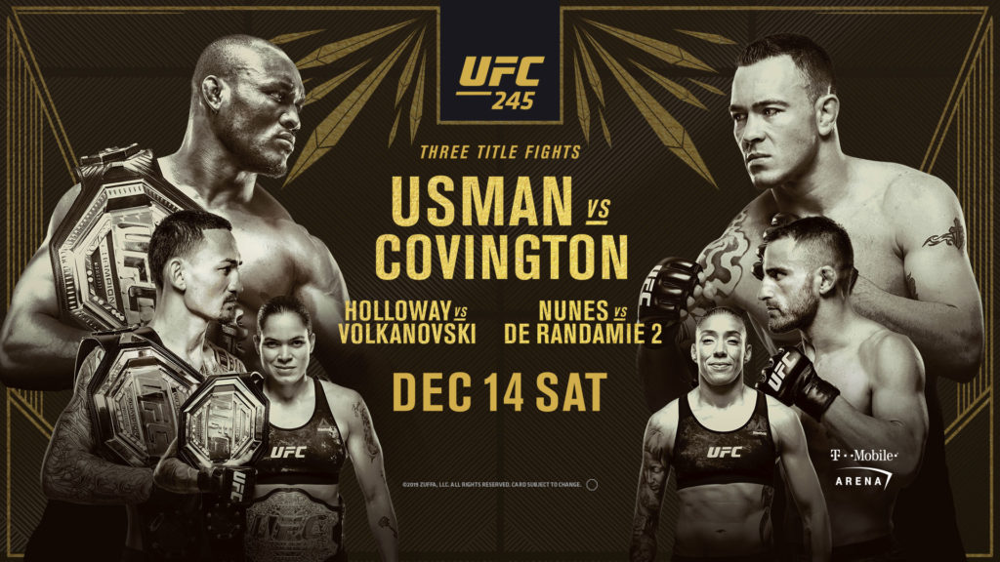

In [2]:
from IPython.display import Image
Image("/kaggle/input/ufc245/UFC 245.jpg")

In [2]:
import re
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
pd.options.display.max_columns = None
pd.options.display.max_rows = None
import sklearn
print('The scikit-learn version is {}.'.format(sklearn.__version__))

The scikit-learn version is 0.23.2.


In [3]:
df = pd.read_csv('./data.csv')

b_age = df['B_age']  #  we replace B_age to put it among B features 
df.drop(['B_age'], axis = 1, inplace = True)
df.insert(76, "B_age", b_age)

df_fe = df.copy() #  We make a copy of the dataframe for the feature engineering part later

df.head(5)

,R_fighter,B_fighter,Referee,date,location,Winner,title_bout,weight_class,no_of_rounds,B_current_lose_streak,B_current_win_streak,B_draw,B_avg_BODY_att,B_avg_BODY_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_KD,B_avg_LEG_att,B_avg_LEG_landed,B_avg_PASS,B_avg_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_SIG_STR_pct,B_avg_SUB_ATT,B_avg_TD_att,B_avg_TD_landed,B_avg_TD_pct,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_longest_win_streak,B_losses,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_opp_KD,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_opp_PASS,B_avg_opp_REV,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_opp_SIG_STR_pct,B_avg_opp_SUB_ATT,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_opp_TD_pct,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_total_rounds_fought,B_total_time_fought(seconds),B_total_title_bouts,B_win_by_Decision_Majority,B_win_by_Decision_Split,B_win_by_Decision_Unanimous,B_win_by_KO/TKO,B_win_by_Submission,B_win_by_TKO_Doctor_Stoppage,B_wins,B_Stance,B_Height_cms,B_Reach_cms,B_Weight_lbs,B_age,R_current_lose_streak,R_current_win_streak,R_draw,R_avg_BODY_att,R_avg_BODY_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_KD,R_avg_LEG_att,R_avg_LEG_landed,R_avg_PASS,R_avg_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_SIG_STR_pct,R_avg_SUB_ATT,R_avg_TD_att,R_avg_TD_landed,R_avg_TD_pct,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_longest_win_streak,R_losses,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_opp_KD,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_opp_PASS,R_avg_opp_REV,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_opp_SIG_STR_pct,R_avg_opp_SUB_ATT,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_opp_TD_pct,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_total_rounds_fought,R_total_time_fought(seconds),R_total_title_bouts,R_win_by_Decision_Majority,R_win_by_Decision_Split,R_win_by_Decision_Unanimous,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_wins,R_Stance,R_Height_cms,R_Reach_cms,R_Weight_lbs,R_age
0,Henry Cejudo,Marlon Moraes,Marc Goddard,2019-06-08,"Chicago, Illinois, USA",Red,True,Bantamweight,5,0.0,4.0,0.0,9.200000,6.000000,0.200000,0.000000,62.600000,20.600000,2.600000,2.000000,48.600000,11.200000,0.800000,7.6,5.400000,0.400000,0.000000,65.40,22.600000,0.466000,0.400000,0.80000,0.200000,0.100000,66.400000,23.600000,4.0,1.0,6.400000,4.000000,1.000000,0.60000,51.200000,17.400000,0.600000,0.200000,39.600000,9.400000,0.200000,6.80000,4.800000,0.000000,0.000000,52.800000,18.20000,0.236000,0.000000,1.000000,0.400000,0.100000,53.800000,19.200000,9.0,419.400000,0.0,0.0,1.0,0.0,2.0,1.0,0.0,4.0,Orthodox,167.64,170.18,135.0,31.0,0.0,4.0,0.0,21.900000,16.400000,17.000000,11.000000,75.000000,26.500000,9.400000,6.500000,74.200000,23.90,0.400,5.300000,3.700000,1.200000,0.000000,101.400000,44.000000,0.466000,0.100000,5.300000,1.900000,0.458000,129.900000,69.100000,4.0,2.0,13.300000,8.800000,7.500000,5.100000,90.500000,26.800000,0.800000,0.300000,76.100000,17.300000,0.100000,9.400000,6.100000,0.000000,0.000000,98.800000,32.200000,0.336000,0.000000,0.900000,0.100000,0.050000,110.500000,43.300000,27.0,742.60,3.0,0.0,2.0,4.0,2.0,0.0,0.0,8.0,Orthodox,162.56,162.56,135.0,32.0
1,Valentina Shevchenko,Jessica Eye,Robert Madrigal,2019-06-08,"Chicago, Illinois, USA",Red,True,Women's Flyweight,5,0.0,3.0,0.0,14.600000,9.100000,11.800000,7.300000,124.700000,42.100000,2.400000,1.900000,112.000000,32.000000,0.000000,

In [4]:
print(df.shape)
len(df[df['Winner'] == 'Draw'])

(5144, 145)


83

The last fight (and ufc event) recorded on this dataset was on the 8th November of 2019.

In [5]:
last_fight = df.loc[0, ['date']]
print(last_fight)

date    2019-06-08
Name: 0, dtype: object


# Data Cleaning

Before April 2001, there were almost no rules in UFC (no judges, no time limits, no rounds, etc.). It's up to this precise date that UFC started to implement a set of rules known as "Unified Rules of Mixed Martial Arts" in accordance with the New Jersey State Athletic Control Board in United States. Therefore, we delete all fights before this major update in UFC's rules history. 

In [6]:
limit_date = '2001-04-01'
df = df[(df['date'] > limit_date)]
print(df.shape)

(4887, 145)


In [7]:
print("Total NaN in dataframe :" , df.isna().sum().sum())
print("Total NaN in each column of the dataframe")
na = []
for index, col in enumerate(df):
    na.append((index, df[col].isna().sum())) 
na_sorted = na.copy()
na_sorted.sort(key = lambda x: x[1], reverse = True) 

for i in range(len(df.columns)):
    print(df.columns[na_sorted[i][0]],":", na_sorted[i][1], "NaN")

Total NaN in dataframe : 83701
Total NaN in each column of the dataframe
B_avg_BODY_att : 1136 NaN
B_avg_BODY_landed : 1136 NaN
B_avg_CLINCH_att : 1136 NaN
B_avg_CLINCH_landed : 1136 NaN
B_avg_DISTANCE_att : 1136 NaN
B_avg_DISTANCE_landed : 1136 NaN
B_avg_GROUND_att : 1136 NaN
B_avg_GROUND_landed : 1136 NaN
B_avg_HEAD_att : 1136 NaN
B_avg_HEAD_landed : 1136 NaN
B_avg_KD : 1136 NaN
B_avg_LEG_att : 1136 NaN
B_avg_LEG_landed : 1136 NaN
B_avg_PASS : 1136 NaN
B_avg_REV : 1136 NaN
B_avg_SIG_STR_att : 1136 NaN
B_avg_SIG_STR_landed : 1136 NaN
B_avg_SIG_STR_pct : 1136 NaN
B_avg_SUB_ATT : 1136 NaN
B_avg_TD_att : 1136 NaN
B_avg_TD_landed : 1136 NaN
B_avg_TD_pct : 1136 NaN
B_avg_TOTAL_STR_att : 1136 NaN
B_avg_TOTAL_STR_landed : 1136 NaN
B_avg_opp_BODY_att : 1136 NaN
B_avg_opp_BODY_landed : 1136 NaN
B_avg_opp_CLINCH_att : 1136 NaN
B_avg_opp_CLINCH_landed : 1136 NaN
B_avg_opp_DISTANCE_att : 1136 NaN
B_avg_opp_DISTANCE_landed : 1136 NaN
B_avg_opp_GROUND_att : 1136 NaN
B_avg_opp_GROUND_landed : 1136 N

Most NaN values can be explained because of empty statistics of new fighters joining UFC and fighting for their first time. Actually, they get NaN values until their first fight, so according to how the dataset is built, those statistics are filled in their second fight. 

As there are just a few, we replace weight, height, age and reach NaN values by the median value obtained from each of those features. 
We also replace 'B_Stance' and 'R_Stance' NaN values by the mode which in our case is "Orthodox" stance. 

In [8]:
from sklearn.impute import SimpleImputer

imp_features = ['R_Weight_lbs', 'R_Height_cms', 'B_Height_cms', 'R_age', 'B_age', 'R_Reach_cms', 'B_Reach_cms']
imp_median = SimpleImputer(missing_values=np.nan, strategy='median')

for feature in imp_features:
    imp_feature = imp_median.fit_transform(df[feature].values.reshape(-1,1))
    df[feature] = imp_feature

imp_stance = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imp_R_stance = imp_stance.fit_transform(df['R_Stance'].values.reshape(-1,1))
imp_B_stance = imp_stance.fit_transform(df['B_Stance'].values.reshape(-1,1))
df['R_Stance'] = imp_R_stance
df['B_Stance'] = imp_B_stance

In [9]:
print('Number of features with NaN values :', len([x[1] for x in na if x[1] > 0]))

Number of features with NaN values : 108


We delete all NaN rows from na_features columns. We also drop Referee and location columns as they are useless (no predictive power) for the model we want to build. 

In [10]:
na_features = ['B_avg_BODY_att', 'R_avg_BODY_att']
df.dropna(subset = na_features, inplace = True)

df.drop(['Referee', 'location'], axis = 1, inplace = True)

In [11]:
print(df.shape)
print("Total NaN in dataframe :" , df.isna().sum().sum())

(3549, 143)
Total NaN in dataframe : 0


# Feature Engineering

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3549 entries, 0 to 4881
Columns: 143 entries, R_fighter to R_age
dtypes: bool(1), float64(134), int64(1), object(7)
memory usage: 3.9+ MB


There are 135 quantitative features and 8 categorical features. 
Let's see which features are categorical features.

In [13]:
list(df.select_dtypes(include=['object', 'bool']))

['R_fighter',
 'B_fighter',
 'date',
 'Winner',
 'title_bout',
 'weight_class',
 'B_Stance',
 'R_Stance']

We delete B_draw and R_draw columns as all their values are fixed to 0 (constant). We still need to keep date to filter our dataframe and also the rest of the categorical features. 

In [14]:
print(df['B_draw'].value_counts())
print(df['R_draw'].value_counts())
df.drop(['B_draw', 'R_draw'], axis=1, inplace=True)

0.0    3549
Name: B_draw, dtype: int64
0.0    3549
Name: R_draw, dtype: int64


We also delete every match where the result is a draw (equality), indeed we don't want to add an additional class to our target variable. As we have already seen earlier, only 83 fights were a draw in the dataset. Now we only have a winner and a looser.  We delete 'Catch Weight' rows from weight_class feature as those fights are anecdotals. 

In [15]:
df = df[df['Winner'] != 'Draw']
df = df[df['weight_class'] != 'Catch Weight']

<AxesSubplot:>

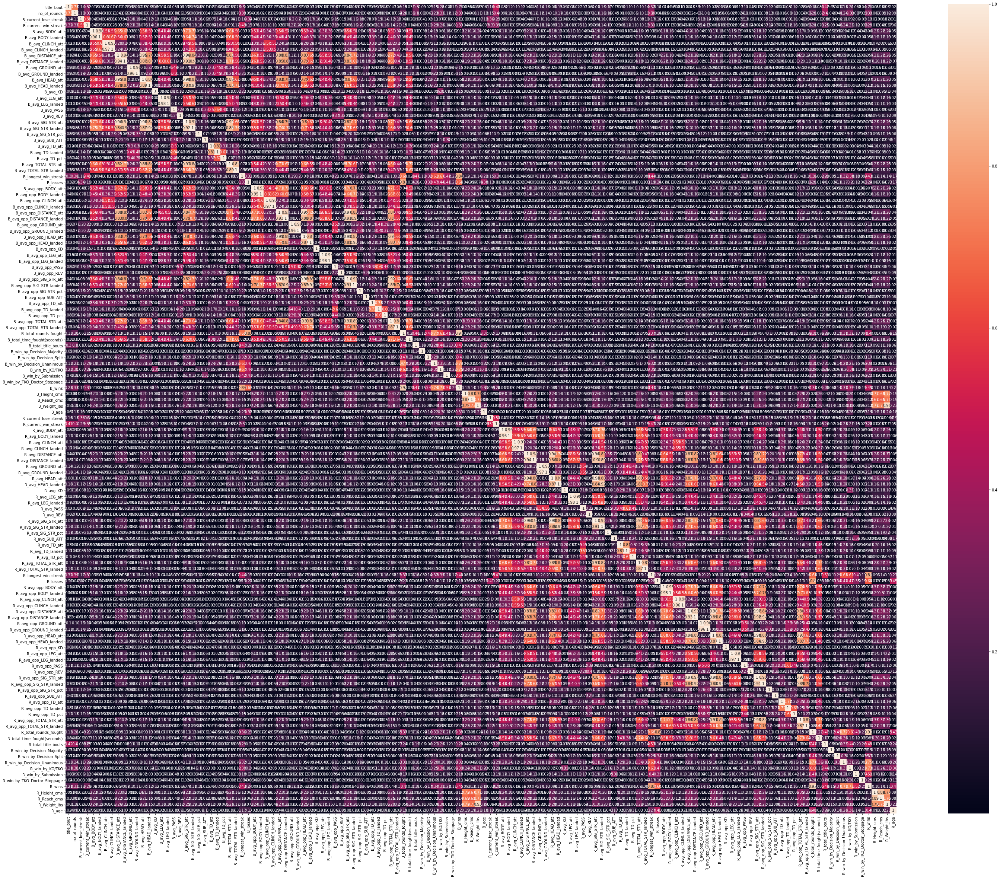

In [16]:
plt.figure(figsize=(50, 40))
corr_matrix = df.corr(method = 'pearson').abs()
sns.heatmap(corr_matrix, annot=True)

In [17]:
sol = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1)
                 .astype(np.bool))
                 .stack()
                 .sort_values(ascending=False))
print(sol[0:10])

R_avg_opp_HEAD_att      R_avg_opp_SIG_STR_att    0.983954
B_avg_opp_HEAD_att      B_avg_opp_SIG_STR_att    0.982233
B_avg_HEAD_att          B_avg_SIG_STR_att        0.979075
B_avg_LEG_att           B_avg_LEG_landed         0.979058
B_avg_opp_LEG_att       B_avg_opp_LEG_landed     0.977229
R_avg_HEAD_att          R_avg_SIG_STR_att        0.977224
R_avg_LEG_att           R_avg_LEG_landed         0.975762
R_avg_opp_LEG_att       R_avg_opp_LEG_landed     0.971767
R_avg_GROUND_att        R_avg_GROUND_landed      0.971048
R_avg_opp_DISTANCE_att  R_avg_opp_SIG_STR_att    0.970609
dtype: float64


We can notice that variables which are higly correlated between each other are the "attempted" and "landed" ones. Intuitively, the more strikes a fighter attempts, the more strikes are actually landed to his opponent.  
For instance, the higher the average significant head strikes "landed of attempted" for one fighter, the higher the average significant strikes "landed of attempted" he will get.  

Though, we can't only keep "landed" variables because we need to know the accuracy of the fighter (whether on leg kicks, head or body strikes, submission , clinches, etc.). Maybe he attempts a lot of shots but has a hard time touching his opponent.  
We will try to transform some features and hence reduce the number of variables to build a more comprehensive and lighter dataframe later. The goal is to keep main informations while avoiding dependence between features. But first, we are going to use all our dataframe features on the model. 

We can also notice that the number of rounds is highly correlated to the title bout. The rule is that for a title bout, the fights must last 5 rounds maximum and only 3 for a non title bout. But UFC changed rules to allow non title bout fights to last 5 rounds (those on the main cards acctually). 

# Data Preprocessing

As we only need the last fights of UFC fighters to get their last updated statistics and hence feed it into our model, we don't need to keep previous fights of active fighters as it won't make any differences in the model's performance.  
In another words, the dataset train/test split strategy will be the following :
1. We train our model on every fighter's fight at t-1 where t is the last fight of the fighter. 
2. We then test our model on every fighter's fight at t. 
3. We drop row fights at moments t-2, t-3, etc.

In [18]:
#  i = index of the fighter's fight, 0 means the last fight, -1 means first fight
def select_fight_row(df, name, i): 
    df_temp = df[(df['R_fighter'] == name) | (df['B_fighter'] == name)]  # filter df on fighter's name
    df_temp.reset_index(drop=True, inplace=True) #  as we created a new temporary dataframe, we have to reset indexes
    idx = max(df_temp.index)  #  get the index of the oldest fight
    if i > idx:  #  if we are looking for a fight that didn't exist, we return nothing
        return 
    arr = df_temp.iloc[i,:].values
    return arr

select_fight_row(df, 'Amanda Nunes', 0) #  we get the last fight of Amanda Nunes

array(['Cris Cyborg', 'Amanda Nunes', '2018-12-29', 'Blue', True,
       "Women's Featherweight", 5, 0.0, 7.0, 9.7, 6.2, 3.2, 2.1, 58.0,
       28.4, 17.5, 9.9, 52.9, 24.1, 0.2, 16.1, 10.1, 1.4, 0.0, 78.7, 40.4,
       0.5660000000000001, 0.4, 2.6, 1.1, 0.28200000000000003, 90.9, 50.3,
       7.0, 1.0, 5.0, 3.3, 3.6, 2.4, 46.0, 15.3, 6.1, 4.4, 44.4, 14.3,
       0.0, 6.3, 4.5, 0.8, 0.1, 55.7, 22.1, 0.32799999999999996, 0.3, 2.2,
       0.5, 0.212, 68.1, 33.4, 22.0, 533.4, 4.0, 0.0, 1.0, 1.0, 5.0, 2.0,
       0.0, 9.0, 'Orthodox', 172.72, 175.26, 145.0, 30.0, 0.0, 5.0, 22.8,
       18.2, 17.2, 13.4, 81.6, 42.6, 16.4, 11.0, 82.8, 40.0, 0.4, 9.6,
       8.8, 1.0, 0.0, 115.2, 67.0, 0.62, 0.0, 0.8, 0.6, 0.4, 124.6, 75.6,
       5.0, 0.0, 10.0, 5.8, 5.2, 3.8, 65.0, 15.4, 0.8, 0.2, 55.4, 10.4,
       0.0, 5.6, 3.2, 0.2, 0.0, 71.0, 19.4, 0.366, 0.0, 1.8, 0.4, 0.1,
       77.6, 25.2, 12.0, 590.2, 3.0, 0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 5.0,
       'Orthodox', 172.72, 172.72, 145.0, 33.0], dtype=obje

In [19]:
# get all active UFC fighters (according to the limit_date parameter)
def list_fighters(df, limit_date):
    df_temp = df[df['date'] > limit_date]
    set_R = set(df_temp['R_fighter'])
    set_B = set(df_temp['B_fighter'])
    fighters = list(set_R.union(set_B))
    return fighters

In [20]:
fighters = list_fighters(df, '2017-01-01')
print(len(fighters))

624


We build a new DataFrame by adding the last fight of every active UFC fighters and we build another Dataframe by adding the second last fight of every active UFC fighter. 

In [21]:
def build_df(df, fighters, i):      
    arr = [select_fight_row(df, fighters[f], i) for f in range(len(fighters)) if select_fight_row(df, fighters[f], i) is not None]
    cols = [col for col in df] 
    df_fights = pd.DataFrame(data=arr, columns=cols)
    df_fights.drop_duplicates(inplace=True)
    df_fights['title_bout'] = df_fights['title_bout'].replace({True: 1, False: 0})
    df_fights.drop(['R_fighter', 'B_fighter', 'date'], axis=1, inplace=True)
    return df_fights

df_train = build_df(df, fighters, 0)
df_test = build_df(df, fighters, 1)

In [22]:
df_train.head(5)

,Winner,title_bout,weight_class,no_of_rounds,B_current_lose_streak,B_current_win_streak,B_avg_BODY_att,B_avg_BODY_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_KD,B_avg_LEG_att,B_avg_LEG_landed,B_avg_PASS,B_avg_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_SIG_STR_pct,B_avg_SUB_ATT,B_avg_TD_att,B_avg_TD_landed,B_avg_TD_pct,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_longest_win_streak,B_losses,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_opp_KD,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_opp_PASS,B_avg_opp_REV,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_opp_SIG_STR_pct,B_avg_opp_SUB_ATT,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_opp_TD_pct,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_total_rounds_fought,B_total_time_fought(seconds),B_total_title_bouts,B_win_by_Decision_Majority,B_win_by_Decision_Split,B_win_by_Decision_Unanimous,B_win_by_KO/TKO,B_win_by_Submission,B_win_by_TKO_Doctor_Stoppage,B_wins,B_Stance,B_Height_cms,B_Reach_cms,B_Weight_lbs,B_age,R_current_lose_streak,R_current_win_streak,R_avg_BODY_att,R_avg_BODY_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_KD,R_avg_LEG_att,R_avg_LEG_landed,R_avg_PASS,R_avg_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_SIG_STR_pct,R_avg_SUB_ATT,R_avg_TD_att,R_avg_TD_landed,R_avg_TD_pct,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_longest_win_streak,R_losses,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_opp_KD,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_opp_PASS,R_avg_opp_REV,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_opp_SIG_STR_pct,R_avg_opp_SUB_ATT,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_opp_TD_pct,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_total_rounds_fought,R_total_time_fought(seconds),R_total_title_bouts,R_win_by_Decision_Majority,R_win_by_Decision_Split,R_win_by_Decision_Unanimous,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_wins,R_Stance,R_Height_cms,R_Reach_cms,R_Weight_lbs,R_age
0,Blue,0,Lightweight,3,4.0,0.0,20.375000,13.250000,8.625000,7.125000,106.000000,45.000000,4.875000,3.750000,84.000000,30.625000,0.125000,15.125000,12.000000,0.500000,0.250000,119.500000,55.875000,0.465000,0.125000,2.500000,0.625000,0.228750,129.750000,65.000000,4.0,4.0,19.250000,9.875000,6.500000,3.375000,122.250000,42.750000,6.500000,4.000000,104.000000,31.750000,0.375000,12.000000,8.500000,0.750000,0.000000,135.250000,50.125000,0.355000,0.125000,4.000000,1.250000,0.168750,146.125000,59.000000,20.0,721.000000,0.0,0.0,1.0,1.0,1.0,1.0,0.0,4.0,Orthodox,177.80,180.34,155.0,31.0,1.0,0.0,3.500000,3.250000,5.750000,4.625000,37.250000,10.250000,3.625000,2.875000,39.500000,11.500000,0.250000,3.625000,3.000000,0.625000,0.000000,46.625000,17.750000,0.372500,0.750000,0.500000,0.250000,0.062500,58.375000,28.750000,2.0,4.0,7.750000,5.250000,7.375000,5.375000,26.000000,8.250000,15.500000,11.000000,36.000000,16.000000,0.375000,5.125000,3.375000,0.875000,0.000000,48.875000,24.625000,0.463750,0.250000,5.625000,0.875000,0.110000,71.250000,43.250000,16.0,508.875000,0.0,0.0,0.0,1.0,2.0,1.0,0.0,4.0,Southpaw,177.80,180.34,155.0,29.0
1,Blue,0,Light Heavyweight,3,1.0,0.0,9.285714,6.142857,6.714286,5.285714,62.428571,25.857143,3.714286,2.714286,60.428571,25.000000,0.428571,3.142857,2.714286,0.571429,0.285714,72.857143,33.857143,0.444286,0.285714,1.428571,0.428571,0.104286,78.571429,39.000000,3.0,3.0,10.571429,7.714286,7.142857,4.285714,55.428571,25.285714,19.571429,15.428571,

In [23]:
print(df_train.shape)
print(df_test.shape)

(439, 138)
(438, 138)


The train and test sets are pretty well balanced. We don't need to apply sampling techniques here.

In [24]:
print(len(df_train[df_train['Winner'] == 'Blue']))
print(len(df_train[df_train['Winner'] == 'Red']))
print(len(df_test[df_test['Winner'] == 'Blue']))
print(len(df_test[df_test['Winner'] == 'Red']))

217
222
196
242


Let's create a column transformer to encode each categorical feature.  
We will rather use ordinal encoder than one-hot-encoder as it leads to a poorer accuracy on Random Forest model when dummie features get high. Here is a good explanation why : https://towardsdatascience.com/one-hot-encoding-is-making-your-tree-based-ensembles-worse-heres-why-d64b282b5769.  

In [25]:
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.compose import make_column_transformer

preprocessor = make_column_transformer((OrdinalEncoder(), ['weight_class', 'B_Stance', 'R_Stance']), remainder='passthrough')

# If the winner is from the Red corner, Winner label will be encoded as 1, otherwise it will be 0 (Blue corner)
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(df_train['Winner'])
y_test = label_encoder.transform(df_test['Winner'])

X_train, X_test = df_train.drop(['Winner'], axis=1), df_test.drop(['Winner'], axis=1)

In [26]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(439, 137)
(439,)
(438, 137)
(438,)


# Random Forest Model

Random Forest is a tree-based model and hence does not require feature scaling. Those algorithm computations aren't based on distance (euclidian distance or whatever), therefore, normalizing data is useless.

In [28]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score

# Random Forest composed of 100 decision trees. We optimized parameters using cross-validation and GridSearch tool paired together
random_forest = RandomForestClassifier(n_estimators=100, 
                                       criterion='entropy', 
                                       max_depth=10, 
                                       min_samples_split=2,
                                       min_samples_leaf=1, 
                                       random_state=0)

model = Pipeline([('encoding', preprocessor), ('random_forest', random_forest)])
model.fit(X_train, y_train)

# We use cross-validation with 5-folds to have a more precise accuracy (reduce variation)
accuracies = cross_val_score(estimator=model, X=X_train, y=y_train, cv=5)
print('Accuracy mean : ', accuracies.mean())
print('Accuracy standard deviation : ', accuracies.std())

y_pred = model.predict(X_test)
print('Testing accuracy : ', accuracy_score(y_test, y_pred), '\n')

target_names = ["Blue","Red"]
print(classification_report(y_test, y_pred, labels=[0,1], target_names=target_names))

Accuracy mean :  0.5925026123301985
Accuracy standard deviation :  0.06367976970710013
Testing accuracy :  0.723744292237443 

              precision    recall  f1-score   support

        Blue       0.69      0.69      0.69       196
         Red       0.75      0.75      0.75       242

    accuracy                           0.72       438
   macro avg       0.72      0.72      0.72       438
weighted avg       0.72      0.72      0.72       438



We get a mean accuracy of 0.53 on the cross_val_score and 0.7 for the f1-score. The discrepancy between cross and test score is maybe due to the fact that the model does well in this particular test set but doesn't generalize well. At least the mean accuracy on train data is higher than a random choice (0.5) and that's a good point as MMA is a very uncertain sport. 

In [29]:
#from sklearn.model_selection import GridSearchCV
#parameters = [{'random_forest__n_estimators': [10, 50, 100, 500, 1000],
#               'random_forest__criterion': ['gini', 'entropy'],
#               'random_forest__max_depth': [5, 10, 50],
#               'random_forest__min_samples_split': [2, 3, 4],
#               'random_forest__min_samples_leaf': [1, 2, 3],
#              }]
#model = Pipeline([('encoding', preprocessor), ('random_forest', RandomForestClassifier())])

#grid_search = GridSearchCV(estimator=model, param_grid=parameters, scoring='accuracy', cv=5, n_jobs=-1)
#grid_search = grid_search.fit(X_train, y_train)
#best_accuracy = grid_search.best_score_

#best_params = grid_search.best_params_
#print('Best accuracy : ', best_accuracy)
#print('Best parameters : ', best_params)

Remind that Blue => 0 and Red => 1 for the target value (Winner).

[Text(0, 0.5, 'Blue'), Text(0, 1.5, 'Red')]

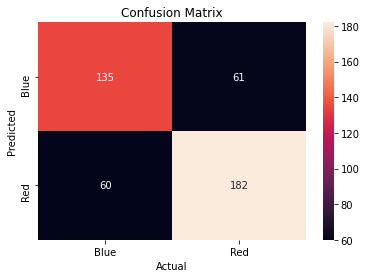

In [30]:
from sklearn.metrics import confusion_matrix

# The confusion matrix looks like the shape below:
# [TN FN
#  FP TP]
cm = confusion_matrix(y_test, y_pred) 
ax = plt.subplot()
sns.heatmap(cm, annot = True, ax = ax, fmt = "d")
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Confusion Matrix")
ax.xaxis.set_ticklabels(['Blue', 'Red'])
ax.yaxis.set_ticklabels(['Blue', 'Red'])

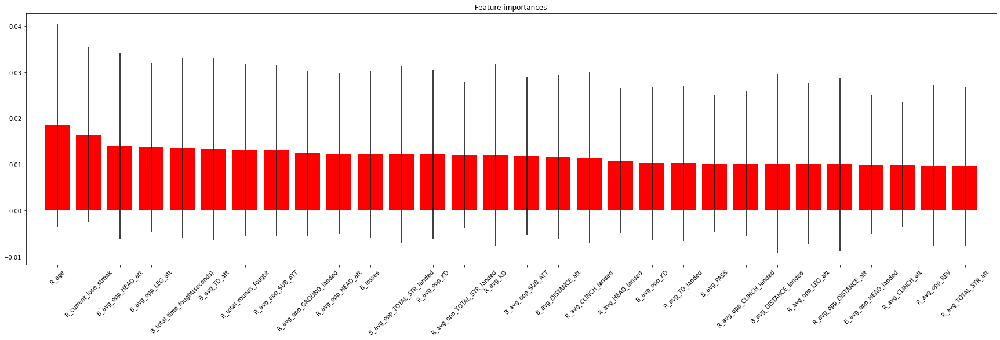

In [31]:
feature_names = [col for col in X_train]
feature_importances = model['random_forest'].feature_importances_
indices = np.argsort(feature_importances)[::-1]
n = 30 # maximum feature importances displayed
idx = indices[0:n] 
std = np.std([tree.feature_importances_ for tree in model['random_forest'].estimators_], axis=0)

#for f in range(n):
#    print("%d. feature %s (%f)" % (f + 1, feature_names[idx[f]], feature_importances[idx[f]])) 

plt.figure(figsize=(30, 8))
plt.title("Feature importances")
plt.bar(range(n), feature_importances[idx], color="r", yerr=std[idx], align="center")
plt.xticks(range(n), [feature_names[id] for id in idx], rotation = 45) 
plt.xlim([-1, n]) 
plt.show()

There are no big significant features that could explain by themselves the model results. Almost all variables have an impact on the model even if it's on a very small proportion.  
But we can notice that age, takedowns attempts, current lose streak (if the fighter is on a big loose streak, he has highest chance to loose again), clinched landed, significant strikes that opponents are doing on fighters play a slightly bigger role which makes sense.  


Let's visualize now the construction of a random single Decision Tree among the Forest. 

In [40]:
from sklearn.tree import export_graphviz
from subprocess import call
from IPython.display import Image

tree_estimator = model['random_forest'].estimators_[10]
export_graphviz(tree_estimator, 
                out_file='tree.dot', 
                filled=True, 
                rounded=True)
#call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
Image(filename = 'tree.png')

## Predictions

Let's make predictions on the next UFC event introducing one waited fight on the main card between Kamaru Usman and Colby Covington (event occuring the 15/12/2019, UFC 245).

In [41]:
def predict(df, pipeline, blue_fighter, red_fighter, weightclass, rounds, title_bout=False): 
    
    #We build two dataframes, one for each figther 
    f1 = df[(df['R_fighter'] == blue_fighter) | (df['B_fighter'] == blue_fighter)].copy()
    f1.reset_index(drop=True, inplace=True)
    f1 = f1[:1]
    f2 = df[(df['R_fighter'] == red_fighter) | (df['B_fighter'] == red_fighter)].copy()
    f2.reset_index(drop=True, inplace=True)
    f2 = f2[:1]
    
    # if the fighter was red/blue corner on his last fight, we filter columns to only keep his statistics (and not the other fighter)
    # then we rename columns according to the color of  the corner in the parameters using re.sub()
    if (f1.loc[0, ['R_fighter']].values[0]) == blue_fighter:
        result1 = f1.filter(regex='^R', axis=1).copy() #here we keep the red corner stats
        result1.rename(columns = lambda x: re.sub('^R','B', x), inplace=True)  #we rename it with "B_" prefix because he's in the blue_corner
    else: 
        result1 = f1.filter(regex='^B', axis=1).copy()
    if (f2.loc[0, ['R_fighter']].values[0]) == red_fighter:
        result2 = f2.filter(regex='^R', axis=1).copy()
    else:
        result2 = f2.filter(regex='^B', axis=1).copy()
        result2.rename(columns = lambda x: re.sub('^B','R', x), inplace=True)
        
    fight = pd.concat([result1, result2], axis = 1) # we concatenate the red and blue fighter dataframes (in columns)
    fight.drop(['R_fighter','B_fighter'], axis = 1, inplace = True) # we remove fighter names
    fight.insert(0, 'title_bout', title_bout) # we add tittle_bout, weight class and number of rounds data to the dataframe
    fight.insert(1, 'weight_class', weightclass)
    fight.insert(2, 'no_of_rounds', rounds)
    fight['title_bout'] = fight['title_bout'].replace({True: 1, False: 0})
    
    pred = pipeline.predict(fight)
    proba = pipeline.predict_proba(fight)
    if (pred == 1.0): 
        print("The predicted winner is", red_fighter, 'with a probability of', round(proba[0][1] * 100, 2), "%")
    else:
        print("The predicted winner is", blue_fighter, 'with a probability of ', round(proba[0][0] * 100, 2), "%")
    return proba

In [42]:
predict(df, model, 'Kamaru Usman', 'Colby Covington', 'Welterweight', 5, True) 

The predicted winner is Colby Covington with a probability of 53.98 %


array([[0.46022449, 0.53977551]])

In [43]:
predict(df, model, 'Max Holloway', 'Alexander Volkanovski', 'Featherweight', 5, True) 

The predicted winner is Alexander Volkanovski with a probability of 59.27 %


array([[0.40729813, 0.59270187]])

In [44]:
predict(df, model, 'Amanda Nunes', 'Germaine de Randamie', "Women's Bantamweight", 5, True)

The predicted winner is Amanda Nunes with a probability of  61.71 %


array([[0.61708851, 0.38291149]])

In [45]:
predict(df, model, 'Jose Aldo', 'Marlon Moraes', 'Bantamweight', 3, False)

The predicted winner is Marlon Moraes with a probability of 62.15 %


array([[0.37850795, 0.62149205]])

In [46]:
predict(df, model, 'Urijah Faber', 'Petr Yan', 'Bantamweight', 3, False)

The predicted winner is Petr Yan with a probability of 61.26 %


array([[0.38744127, 0.61255873]])